# Data Processing

In [4]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tabulate import tabulate
import collections
import pickle,os,csv
from pathlib import Path  
import itertools
import seaborn as sns
import glob
import os
from scipy import stats

In [ ]:
# set current working directory, set to yours
os.chdir("C:/Users/mmsup/Downloads/")
print(os.getcwd())

C:\Users\mmsup\Downloads


In [6]:
# import models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

# import model evaluation metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import imblearn
from imblearn.under_sampling import RandomUnderSampler
from sklearn.utils import resample
from sklearn.metrics import accuracy_score


In [ ]:
# import datasets
synonyms = "Original_Data_Files/drugbank\ vocabulary.csv"
drug_syn = pd.read_csv(synonyms)
drug_sider = pd.read_csv('Original_Data_Files/drug_names.tsv', sep='\t')
drug_SE = pd.read_csv('Original_Data_Files/meddra_all_se.tsv', sep='\t')
# clinical_ann = pd.read_csv('clinical_annotations.tsv', sep='\t')
# clinical_var = pd.read_csv('clinicalVariants.tsv', sep='\t')
# DBID_indications = pd.read_excel('pcbi.1006614.s001.xlsx', 'Guney+repoDB_data') #this only contains the correct predictions
DB_summary = pd.read_csv('Original_Data_Files/drugbank.tsv', sep='\t')

In [29]:
# Generate drug names to DBID dictionary 

drug_syn['synlist'] = ""
for i in range(0, len(drug_syn['Synonyms'])):
    drug_syn.loc[i, 'synlist'] = ", ".join(str(drug_syn.loc[i, 'Synonyms']).lower().split(" | "))
    drug_syn.loc[i, 'Common name'] = drug_syn.loc[i, 'Common name'].lower()

from collections import defaultdict
chemical_to_DBID=defaultdict(set)


for (drug, DBID) in zip(drug_syn['Common name'], drug_syn['DrugBank ID']):
  
  chemical_to_DBID[drug].add(DBID)

for(drug, DBID) in zip(drug_syn['synlist'], drug_syn['DrugBank ID']):
  for i in range(0, len(drug)):
    chemical_to_DBID[drug[i]].add(DBID)

In [30]:
##SIDER drug name dataset processing##

#Rearrange rows and rename columns

drug_sider.loc[-1] = drug_sider.columns.values
drug_sider.sort_index(inplace=True)
drug_sider.reset_index(drop=True, inplace=True)
drug_sider.columns=['drugID', 'drugname']

#Map SIDER drugnames to DBID

for i in range(len(drug_sider['drugname'])):
    drug_sider.loc[i, 'drugname']=drug_sider.loc[i, 'drugname'].lower()

drug_sider['DBID'] = ''
drug_sider['DBID'] = drug_sider['drugname'].map(chemical_to_DBID)

for i in range(len(drug_sider['DBID'])):
    drug_sider.loc[i, 'DBID'] = str(drug_sider.loc[i, 'DBID']).replace('{',"").replace('}',"").replace("'","")
    
#Determine number of DBID match

match_bool=drug_sider['DBID'] !='set()'
match_index = match_bool[match_bool].index

print('The number of matched DBIDS is', sum(drug_sider['DBID'] !='set()'))
print('The number of unmatched DBIDS is', sum(drug_sider['DBID'] =='set()'))

print(drug_sider.head())

The number of matched DBIDS is 1092
The number of unmatched DBIDS is 338
         drugID                  drugname     DBID
0  CID100000085                 carnitine    set()
1  CID100000119        gamma-aminobutyric    set()
2  CID100000137          5-aminolevulinic    set()
3  CID100000143                leucovorin  DB00650
4  CID100000146  5-methyltetrahydrofolate    set()


In [32]:
# Generate SIDER DrugID to DBID - this will map drug_SE drugID to its respective DBID
drugID_to_DBID={}

for i in range(len(drug_sider['drugID'])):
    drugID_to_DBID[drug_sider.loc[i, 'drugID']] = drug_sider.loc[i, 'DBID']

In [33]:
##SIDER all side effect dataset processing##

### skip this code chunk and move to the next code chunk to directly get to results ###

#Rearrange rows and rename columns

drug_SE.loc[-1] = drug_SE.columns.values
drug_SE.sort_index(inplace=True)
drug_SE.reset_index(drop=True, inplace=True)
drug_SE.columns=['drugID', 'unknown', 'UMLS_ID', 'MedRA_concept', 'ULMS_concept', 'side_effect']

#Map SIDER drugID to DBID

drug_SE['DBID'] = ''
drug_SE['DBID'] = drug_SE['drugID'].map(drugID_to_DBID)


#Side effect column data processing

for i in range(len(drug_SE['side_effect'])):
    drug_SE.loc[i, 'side_effect'] = str(drug_SE.loc[i, 'side_effect']).lower()

drug_SE.head()

,drugID,unknown,UMLS_ID,MedRA_concept,ULMS_concept,side_effect,DBID
0,CID100000085,CID000010917,C0000729,LLT,C0000729.1,abdominal cramps,set()
1,CID100000085,CID000010917,C0000729,PT,C0000737,abdominal pain,set()
2,CID100000085,CID000010917,C0000737,LLT,C0000737,abdominal pain,set()
3,CID100000085,CID000010917,C0000737,PT,C0687713,gastrointestinal pain,set()
4,CID100000085,CID000010917,C0000737,PT,C0000737,abdominal pain,set()


In [ ]:
# run to get drug_SE data frame
drug_SE = pd.read_excel('intermediate_data/drug_side_effects.xlsx')

In [84]:
# Generate the list of top 30 side effects in SIDER 4.1
from collections import Counter

side_effect_count = pd.DataFrame(Counter(drug_SE['side_effect']).most_common(30), columns=['Side Effect', 'Drug Count',])

#side_effect_count['Side Effect']

In [85]:
#Generate Dictionary of top 30 side effects with its associated DrugBank ID

from collections import defaultdict

sid_to_dbid = defaultdict(list)
for j in side_effect_count['Side Effect']:
    for i in range(len(drug_SE['side_effect'])):
        if drug_SE['side_effect'][i] == j:
            sid_to_dbid['phen_ind_'+str(j)].append(drug_SE['DBID'][i])

for key, item in sid_to_dbid.items():
    sid_to_dbid[key] = list(set([x for x in item if str(x) !='set()']))

# Functions

In [63]:
#Matrix Generation

def matrix(dic):
    all_rows=[]
    for (drug, dt_set) in dic.items():
        row_data = {'DrugName': drug}
        for dt in dt_set:
            row_data[dt] = 1
        all_rows.append(row_data)
    dt_df = pd.DataFrame(all_rows)
    dt_df = dt_df.fillna(0)
    dt_df = dt_df[dt_df['DrugName'].str.contains('DB')]
    return dt_df

In [45]:
def matrix_approved(dic):
    approved_index = []
    all_rows=[]
    for (drug, dt_set) in dic.items():
        row_data = {'DrugName': drug}
        for dt in dt_set:
            row_data[dt] = 1
        all_rows.append(row_data)
    dt_df = pd.DataFrame(all_rows)
    dt_df = dt_df.fillna(0)
    dt_df = dt_df[dt_df['DrugName'].str.contains('DB')]
    for i, k in enumerate(dt_df['DrugName']):
        for j in approved_drugs:
            if k == j:
                approved_index.append(i)
    dt_df_approved = dt_df.iloc[approved_index]
    return dt_df_approved

In [76]:
#Model Inputs
def model_input(matrix):
    for key, value in sid_to_dbid.items():
        matrix[key]=''
    for key, value in sid_to_dbid.items():
        for i in value:
            matrix.loc[matrix['DrugName'] != i, key] = 0
    for key, value in sid_to_dbid.items():
        for i in value:
            matrix.loc[matrix['DrugName'] == i, key] = 1
    key_all = []
    for key, value in sid_to_dbid.items():
        key_all.append(key)
        
    X = matrix.drop(key_all, axis=1)
    X = X.drop(['DrugName'], axis=1).values
    
    sid_eff_pred = {}
    for j in side_effect_count['Side Effect']:
        sid_eff_pred[j] = matrix['phen_ind_'+str(j)].astype('int')
    
    return X, sid_eff_pred

In [12]:
#Logistic Regression Bootstrapped 100 Times

def log_reg_boot100(X, Y):
    bootstrapNum = 100
    boot_df = pd.DataFrame()
    for k , j in Y.items():
        for i in range (bootstrapNum):
            log_reg = LogisticRegression()
            rus = RandomUnderSampler()
            X_sample, Y_sample = rus.fit_resample(X, j)
            X_train, X_test, Y_train, Y_test = train_test_split(X_sample, Y_sample, train_size = 0.8, test_size=0.2, random_state=1)
            log_reg.fit(X_train, Y_train)
            Y_pred = log_reg.predict(X_test)
            boot_df = pd.concat((boot_df, pd.DataFrame({k: accuracy_score(Y_test, Y_pred)}, index=[i])))
    boot_df = boot_df.apply(lambda x: pd.Series(x.dropna().values))
    return boot_df

In [13]:
#Random Forest Classifier Bootstrapped 100 Times

def rf_boot100(X, Y):
    bootstrapNum = 100
    boot_df_rf = pd.DataFrame()
    for k , j in Y.items():
        for i in range (bootstrapNum):
            rf = RandomForestClassifier()
            rus = RandomUnderSampler()
            X_sample, Y_sample = rus.fit_resample(X, j)
            X_train, X_test, Y_train, Y_test = train_test_split(X_sample, Y_sample, train_size = 0.8, test_size=0.2, random_state=1)
            rf.fit(X_train, Y_train)
            Y_pred = rf.predict(X_test)
            boot_df_rf = pd.concat((boot_df_rf, pd.DataFrame({k: accuracy_score(Y_test, Y_pred)}, index=[i])))
    boot_df_rf = boot_df_rf.apply(lambda x: pd.Series(x.dropna().values))
    return boot_df_rf

In [ ]:
a2n = pickle.load(open('Original_Data_FIles/Pfx050120_dint.pkl', 'rb'))

for i in range(len(DB_summary['groups'])):
    DB_summary.loc[i, 'groups'][i] = DB_summary.loc['groups'][i].split('|')

approved_drugs = set()
approved_dbids = {DB_summary['drugbank_id'][i] for i, group in enumerate(DB_summary['groups']) for drug in group if drug == 'approved'}
for dbid, targets in a2n.items():
    if dbid in approved_dbids:
        approved_drugs.add(dbid)


In [68]:
targets_approved = matrix_approved(a2n)
targets = matrix(a2n)

X, Y = model_input(targets)
X_approved, Y_approved = model_input(targets_approved)

,DrugName,MAPK10,astB,CYP2B6,TTR,ABCB1,SLC6A3,SLC6A2,SLC6A4,ABCG2,...,KCNJ12,malT,oxyR,RIDA,Cyp2b2,Cyp2b9,Cyp2a2,KEAP1,RELA,trpS2
1,DB02501,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,DB08369,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,DB08206,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,DB00285,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,DB00648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [92]:
targets_approved.head()

,DrugName,MAPK10,astB,CYP2B6,TTR,ABCB1,SLC6A3,SLC6A2,SLC6A4,ABCG2,...,phen_ind_insomnia,phen_ind_anaphylactic shock,phen_ind_paraesthesia,phen_ind_somnolence,phen_ind_nervous system disorder,phen_ind_thrombocytopenia,phen_ind_tachycardia,phen_ind_arthralgia,phen_ind_infection,phen_ind_musculoskeletal discomfort
4,DB00285,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,1,1,1,1,0,1,1,1,1,1
7,DB00648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,1,1,1,0,0,1,0
16,DB00043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
17,DB00417,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
22,DB09097,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [93]:
side_effect_count['DBID Match Count'] = ''
# side_effect_count['Matrix Match Count'] = ''
for i, j in enumerate(side_effect_count['Side Effect']):
    side_effect_count.loc[i, 'DBID Match Count'] = len(sid_to_dbid['phen_ind_'+str(j)])

for i, j in enumerate(side_effect_count['Side Effect']):
    side_effect_count.loc[i, 'Matrix Match Count'] = targets_approved['phen_ind_'+str(j)].value_counts()[1]

In [ ]:
side_effect_count.to_excel('intermediate_data/side_effect_count.xlsx')

# Initial Model Evaluation

In [ ]:
a2n = pickle.load(open('Original_Data_Files/Pfx050120_dint.pkl', 'rb'))
targets_approved = matrix_approved(a2n)
targets = matrix(a2n)

X, Y = model_input(targets)
X_approved, Y_approved = model_input(targets_approved)


In [73]:
rus = RandomUnderSampler()
X_sample, Y_sample = rus.fit_resample(X, Y['dizziness'])
X_train, X_test, Y_train, Y_test = train_test_split(X_sample, Y_sample, train_size = 0.8, test_size=0.2, random_state=1)

log_reg = LogisticRegression()
log_reg.fit(X_train, Y_train)
Y_pred_lr = log_reg.predict(X_test)
print('Logistic Regression Classification Report', '\n', classification_report(Y_test, Y_pred_lr))

rf = RandomForestClassifier()
rf.fit(X_train, Y_train)
Y_pred_rf = rf.predict(X_test)
print('Random Forest Classifier Classification Report', '\n', classification_report(Y_test, Y_pred_rf))


svc = LinearSVC()
svc.fit(X_train, Y_train)
Y_pred_svc = svc.predict(X_test)
print('Support Vector Classifier Classification Report', '\n', classification_report(Y_test, Y_pred_svc))

dtc = DecisionTreeClassifier()
dtc.fit(X_train, Y_train)
Y_pred_dtc = dtc.predict(X_test)
print('Decision Tree Classification Report', '\n', classification_report(Y_test, Y_pred_dtc))

gau = GaussianNB()
gau.fit(X_train, Y_train)
Y_pred_gau = gau.predict(X_test)
print('Naive Beysian Classification Report', '\n', classification_report(Y_test, Y_pred_gau))

knn = KNeighborsClassifier()
knn.fit(X_train, Y_train)
Y_pred_knn = knn.predict(X_test)
print('KN Neighbor Classification Report', '\n', classification_report(Y_test, Y_pred_knn))

Logistic Regression Classification Report 
               precision    recall  f1-score   support

           0       0.75      0.89      0.82       144
           1       0.88      0.73      0.79       154

    accuracy                           0.81       298
   macro avg       0.81      0.81      0.80       298
weighted avg       0.82      0.81      0.80       298

Random Forest Classifier Classification Report 
               precision    recall  f1-score   support

           0       0.76      0.88      0.81       144
           1       0.86      0.74      0.80       154

    accuracy                           0.81       298
   macro avg       0.81      0.81      0.81       298
weighted avg       0.81      0.81      0.80       298

Support Vector Classifier Classification Report 
               precision    recall  f1-score   support

           0       0.74      0.88      0.81       144
           1       0.87      0.71      0.78       154

    accuracy                           

In [99]:
rus = RandomUnderSampler()
X_sample, Y_sample = rus.fit_resample(X_approved, Y_approved['dizziness'])
X_train, X_test, Y_train, Y_test = train_test_split(X_sample, Y_sample, train_size = 0.8, test_size=0.2, random_state=1)

log_reg = LogisticRegression()
log_reg.fit(X_train, Y_train)
Y_pred_lr = log_reg.predict(X_test)
print('Logistic Regression Classification Report', '\n', classification_report(Y_test, Y_pred_lr))

rf = RandomForestClassifier()
rf.fit(X_train, Y_train)
Y_pred_rf = rf.predict(X_test)
print('Random Forest Classifier Classification Report', '\n', classification_report(Y_test, Y_pred_rf))


svc = LinearSVC()
svc.fit(X_train, Y_train)
Y_pred_svc = svc.predict(X_test)
print('Support Vector Classifier Classification Report', '\n', classification_report(Y_test, Y_pred_svc))

dtc = DecisionTreeClassifier()
dtc.fit(X_train, Y_train)
Y_pred_dtc = dtc.predict(X_test)
print('Decision Tree Classification Report', '\n', classification_report(Y_test, Y_pred_dtc))

gau = GaussianNB()
gau.fit(X_train, Y_train)
Y_pred_gau = gau.predict(X_test)
print('Naive Beysian Classification Report', '\n', classification_report(Y_test, Y_pred_gau))

knn = KNeighborsClassifier()
knn.fit(X_train, Y_train)
Y_pred_knn = knn.predict(X_test)
print('KN Neighbor Classification Report', '\n', classification_report(Y_test, Y_pred_knn))

Logistic Regression Classification Report 
               precision    recall  f1-score   support

           0       0.65      0.69      0.67       143
           1       0.69      0.65      0.67       152

    accuracy                           0.67       295
   macro avg       0.67      0.67      0.67       295
weighted avg       0.67      0.67      0.67       295

Random Forest Classifier Classification Report 
               precision    recall  f1-score   support

           0       0.64      0.66      0.65       143
           1       0.67      0.65      0.66       152

    accuracy                           0.65       295
   macro avg       0.65      0.65      0.65       295
weighted avg       0.65      0.65      0.65       295

Support Vector Classifier Classification Report 
               precision    recall  f1-score   support

           0       0.64      0.67      0.65       143
           1       0.67      0.64      0.66       152

    accuracy                           

# Evaluation of Confounding Effects of Approved vs Unapproved Drugs with Drugbank Targets ONLY

In [74]:
Y['vomiting'].value_counts()[1]

np.int64(766)

In [75]:
LR_tar = log_reg_boot100(X, Y)
for k , j in Y.items():
    print('This is the LR mean accuracy on x100 bootstrap for '+str(k), LR_tar[k].mean())

This is the LR mean accuracy on x100 bootstrap for dizziness 0.7976510067114093
This is the LR mean accuracy on x100 bootstrap for nausea 0.7921597633136095
This is the LR mean accuracy on x100 bootstrap for headache 0.8035534591194969
This is the LR mean accuracy on x100 bootstrap for rash 0.8357894736842105
This is the LR mean accuracy on x100 bootstrap for vomiting 0.8221172638436484
This is the LR mean accuracy on x100 bootstrap for asthenia 0.7883333333333333
This is the LR mean accuracy on x100 bootstrap for diarrhoea 0.8019713261648747
This is the LR mean accuracy on x100 bootstrap for pruritus 0.7863837638376384
This is the LR mean accuracy on x100 bootstrap for hypersensitivity 0.7990873015873017
This is the LR mean accuracy on x100 bootstrap for abdominal pain 0.8159915611814346
This is the LR mean accuracy on x100 bootstrap for urticaria 0.7963478260869564
This is the LR mean accuracy on x100 bootstrap for body temperature increased 0.7936725663716815
This is the LR mean acc

In [131]:
LR_tar_approved = log_reg_boot100(X_approved, Y_approved)
for k , j in Y.items():
    print('This is the LR mean accuracy on x100 bootstrap for '+str(k), LR_tar_approved[k].mean())

This is the LR mean accuracy on x100 bootstrap for dizziness 0.6814576271186441
This is the LR mean accuracy on x100 bootstrap for nausea 0.6548502994011975
This is the LR mean accuracy on x100 bootstrap for headache 0.6776265822784809
This is the LR mean accuracy on x100 bootstrap for rash 0.6524834437086092
This is the LR mean accuracy on x100 bootstrap for vomiting 0.6963157894736841
This is the LR mean accuracy on x100 bootstrap for asthenia 0.6479026217228465
This is the LR mean accuracy on x100 bootstrap for diarrhoea 0.6816666666666669
This is the LR mean accuracy on x100 bootstrap for pruritus 0.6552238805970149
This is the LR mean accuracy on x100 bootstrap for hypersensitivity 0.6759599999999999
This is the LR mean accuracy on x100 bootstrap for abdominal pain 0.6737446808510638
This is the LR mean accuracy on x100 bootstrap for urticaria 0.690219298245614
This is the LR mean accuracy on x100 bootstrap for body temperature increased 0.6795089285714284
This is the LR mean accu

In [ ]:
LR_approved_summary = pd.DataFrame()
for j, i in enumerate(side_effect_count['Side Effect']):
    LR_approved_summary = pd.concat((LR_approved_summary, pd.DataFrame({'Side Effect': i, 
                               'mean': LR_tar_approved[i].mean(), 
                               'sd': LR_tar_approved[i].describe()[2], 
                               'min': LR_tar_approved[i].describe()[3], 
                               'max': LR_tar_approved[i].describe()[7]}, index=[j])))
    
LR_approved_summary
LR_approved_summary.to_excel("intermediate_data/LR_approved_summary.xlsx")  

C:\Users\mmsup\AppData\Local\Temp\ipykernel_34952\1166159956.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'sd': LR_tar_approved[i].describe()[2],
C:\Users\mmsup\AppData\Local\Temp\ipykernel_34952\1166159956.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'min': LR_tar_approved[i].describe()[3],
C:\Users\mmsup\AppData\Local\Temp\ipykernel_34952\1166159956.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'max': LR_tar_ap

In [78]:
LR_mean = []
for k , j in Y.items():
    LR_mean.append(LR_tar_approved[k].mean())

print(sum(LR_mean)/len(LR_mean))

0.6696122670613746


In [ ]:
results = pd.DataFrame()
for j, i in enumerate(side_effect_count['Side Effect']):
    results = pd.concat((results, pd.DataFrame({'Side Effect': i, 
                               'LR: Unfiltered Drug Targets': LR_tar[i].mean(), 
                               'LR: Approved Drug Targets': LR_tar_approved[i].mean(), 
                               'T-Test Statistic': stats.ttest_rel(LR_tar[i],LR_tar_approved[i])[0], 
                               'P-value': stats.ttest_rel(LR_tar[i],LR_tar_approved[i])[1]}, index=[j])))

results.to_excel("intermediate_data/approved_vs_unapproved_drugs_LR_ttest.xlsx")  
results

,Side Effect,LR: Unfiltered Drug Targets,LR: Approved Drug Targets,T-Test Statistic,P-value
0,dizziness,0.797651,0.653784,57.252124,1.077083e-77
1,nausea,0.792160,0.668293,54.192577,2.095322e-75
2,headache,0.803553,0.666234,48.162522,1.618772e-70
3,rash,0.835789,0.672351,56.005467,8.927586e-77
4,vomiting,0.822117,0.671513,57.389533,8.553938e-78
5,asthenia,0.788333,0.667500,50.442173,1.985738e-72
6,diarrhoea,0.801971,0.692383,34.594487,4.301286e-57
7,pruritus,0.786384,0.667509,39.684260,1.336874e-62
8,hypersensitivity,0.799087,0.669600,46.957951,1.790484e-69
9,abdominal pain,0.815992,0.673234,49.348228,1.602944e-71


# Analysis of Drug Target Coefficients

In [ ]:
### honestly I have no idea what this category is for but it should run with no issues ###

all_drug_targets = set()
for (drug, dt_set) in a2n.items():
    for j in dt_set:
        all_drug_targets.add(j)


In [20]:
approved_drug_targets = {dt for drug in approved_drugs if drug in a2n
                         for dt in a2n[drug]}

In [21]:
nonapproved_drug_targets = all_drug_targets.difference(approved_drug_targets)

In [24]:
from collections import Counter

non_approved_target_count = Counter(target for dt_set in a2n.values() for target in dt_set if target in nonapproved_drug_targets).most_common(10)


In [25]:
len(non_approved_target_count)

10

In [26]:
tar, count = non_approved_target_count[0]
print(tar)

CCNA2


In [27]:
len(all_drug_targets)

3819

In [28]:
len(approved_drug_targets)

2533

In [29]:
len(nonapproved_drug_targets)

1286

In [88]:
key_all = []
for key, value in sid_to_dbid.items():
    key_all.append(key)
features = targets.drop(key_all,axis=1).drop(['DrugName'],axis=1).columns

In [95]:
targets

,DrugName,MAPK10,astB,CYP2B6,TTR,ABCB1,SLC6A3,SLC6A2,SLC6A4,ABCG2,...,phen_ind_insomnia,phen_ind_anaphylactic shock,phen_ind_paraesthesia,phen_ind_somnolence,phen_ind_nervous system disorder,phen_ind_thrombocytopenia,phen_ind_tachycardia,phen_ind_arthralgia,phen_ind_infection,phen_ind_musculoskeletal discomfort
1,DB02501,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,DB08369,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,DB08206,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,DB00285,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,1,1,1,1,0,1,1,1,1,1
7,DB00648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13996,DB07195,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
13998,DB02071,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
14000,DB03230,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
14003,DB01594,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [100]:
coef_df = pd.DataFrame({"Variable": features, "Coefficient": log_reg.coef_[0]})

coef_df.sort_values(by='Coefficient', ascending=False)

,Variable,Coefficient
755,DPP4,1.295374
529,NR1I2,1.278705
351,HTR1B,1.108695
865,GNRHR,1.107154
496,SLC12A1,1.093052
...,...,...
265,TF,-0.903595
610,TNF,-0.922780
1012,folP,-1.069967
32,HTR2A,-1.225565


In [58]:
def log_reg_coef(X, Y):
    bootstrapNum = 1
    results = pd.DataFrame()
    for k , j in Y.items():
        for i in range (bootstrapNum):
            key_all = []
            for key, value in sid_to_dbid.items():
                key_all.append(key)
            features = targets.drop(key_all,axis=1).drop(['DrugName'],axis=1).columns
            log_reg = LogisticRegression()
            rus = RandomUnderSampler()
            X_sample, Y_sample = rus.fit_resample(X, j)
            X_train, X_test, Y_train, Y_test = train_test_split(X_sample, Y_sample, train_size = 0.8, test_size=0.2, random_state=1)
            log_reg.fit(X_train, Y_train)
            Y_pred = log_reg.predict(X_test)
            results = pd.concat((results, pd.DataFrame({"Variable_"+str(k): features, "Coefficient_"+str(k): log_reg.coef_[0]})))
    results = results.apply(lambda x: pd.Series(x.dropna().values))
    return results

In [96]:
LR_tar_coef = log_reg_coef(X, Y)

In [101]:
LR_coef_data = []
for k, j in Y.items():
    for i, var in enumerate(LR_tar_coef['Variable_'+str(k)]):
        for tar, count in non_approved_target_count:
            if var == tar:
                LR_coef_data.append({'Variable_'+str(k): var, 'Coefficient_'+str(k): LR_tar_coef['Coefficient_'+str(k)][i]})
LR_coef = pd.DataFrame()
LR_coef = pd.DataFrame(LR_coef_data).apply(lambda x: pd.Series(x.dropna().values))
LR_coef

,Variable_dizziness,Coefficient_dizziness,Variable_nausea,Coefficient_nausea,Variable_headache,Coefficient_headache,Variable_rash,Coefficient_rash,Variable_vomiting,Coefficient_vomiting,...,Variable_thrombocytopenia,Coefficient_thrombocytopenia,Variable_tachycardia,Coefficient_tachycardia,Variable_arthralgia,Coefficient_arthralgia,Variable_infection,Coefficient_infection,Variable_musculoskeletal discomfort,Coefficient_musculoskeletal discomfort
0,MMP8,-0.301824,MMP8,-0.163688,MMP8,-0.157378,MMP8,-0.310413,MMP8,-0.485021,...,MMP8,0.000000,MMP8,-0.376881,MMP8,0.000000,MMP8,-0.172703,MMP8,-0.094891
1,MMP3,-0.167033,MMP3,-0.297807,MMP3,-0.371254,MMP3,-0.385444,MMP3,-0.157825,...,MMP3,-0.337685,MMP3,0.000000,MMP3,0.000000,MMP3,0.000000,MMP3,0.000000
2,PKIA,-0.361879,PKIA,-0.290693,PKIA,-0.322329,PKIA,-0.099504,PKIA,-0.201631,...,PKIA,-0.119823,PKIA,-0.120429,PKIA,-0.195089,PKIA,-0.139737,PKIA,0.000000
3,thyA,-0.289010,thyA,-0.278938,thyA,-0.390696,thyA,0.000000,thyA,-0.303019,...,thyA,-0.213658,thyA,-0.354350,thyA,0.000000,thyA,0.000000,thyA,-0.417526
4,CCNA2,-0.303230,CCNA2,-0.448729,CCNA2,-0.184468,CCNA2,-0.091888,CCNA2,-0.148561,...,CCNA2,-0.102114,CCNA2,-0.285894,CCNA2,-0.089586,CCNA2,-0.106359,CCNA2,-0.151049
5,BACE1,-0.509418,BACE1,-0.297807,BACE1,-0.560897,BACE1,-0.310413,BACE1,-0.157825,...,BACE1,-0.145072,BACE1,-0.273396,BACE1,-0.164879,BACE1,-0.172703,BACE1,-0.284067
6,NCOA1,-0.328165,NCOA1,-0.276714,NCOA1,-0.445734,NCOA1,-0.387084,NCOA1,-0.138111,...,NCOA1,-0.134437,NCOA1,0.000000,NCOA1,-0.284038,NCOA1,-0.224651,NCOA1,-0.295844
7,map,-0.301824,map,-0.297807,map,-0.284560,map,-0.423823,map,-0.393209,...,map,-0.145072,map,-0.150349,map,-0.164879,map,0.000000,map,-0.389337
8,CTSK,-0.167033,CTSK,-0.163688,CTSK,-0.284560,CTSK,-0.423823,CTSK,-0.767427,...,CTSK,-0.263007,CTSK,-0.150349,CTSK,0.000000,CTSK,-0.154900,CTSK,-0.284067
9,CELA1,-0.301824,CELA1,-0.163688,CELA1,-0.284560,CELA1,-0.596304,CELA1,-0.286002,...,CELA1,-0.145072,CELA1,0.000000,CELA1,-0.297922,CELA1,-0.172703,CELA1,-0.479438


In [ ]:
LR_coef.to_excel("intermediate_data/LR_coefficient_10_most_common_unapproved_drug_targets.xlsx")  

In [ ]:
most_common_unapproved = pd.DataFrame()

for i in range(len(non_approved_target_count)):
    tar, count = non_approved_target_count[i]
    most_common_unapproved = pd.concat((most_common_unapproved, pd.DataFrame({'Target': tar, 'Count': count}, index = [i])))
most_common_unapproved.to_excel("intermediate_data/10_most_common_unapproved_drug_targets.xlsx")

In [ ]:
LR_tar_coef.to_excel("intermediate_data/LR_coefficient_all_drug_targets.xlsx")

# Generate Matrix with Approved Drugs

In [ ]:
# ATC Codes ONLY

# Process ATC_code column
DB_summary['atc_codes'] = DB_summary['atc_codes'].fillna('N/A')
for i in range(len(DB_summary['atc_codes'])):
    DB_summary['atc_codes'][i] = DB_summary['atc_codes'][i].split('|')
    
# Create DBID to ATC dictionary
DBatc = defaultdict(set)

for dbid, targets in a2n.items(): # changed to a2n because omitting PathFX, hopefully this is correct someone please double check
    for i in range(len(DB_summary['atc_codes'])):
        DB_atc = set()
        if dbid == DB_summary['drugbank_id'][i]:
            for j in range(len(DB_summary['atc_codes'][i])):
                DB_atc.add(DB_summary['atc_codes'][i][j][0:3])
            DBatc[DB_summary['drugbank_id'][i]] = DB_atc

# Generate Matrix
ATC_only = matrix_approved(DBatc)
ATC_only = ATC_only[ATC_only['DrugName'].str.contains('DB')]
ATC_only = ATC_only.drop(columns = ['N/A'])
ATC_only

C:\Users\mmsup\AppData\Local\Temp\ipykernel_34952\850280901.py:6: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  DB_summary['atc_codes'][i] = DB_summary['atc_codes'][i].split('|')
C:\Users\mmsup\AppData\Local\Temp\ipykernel_34952\850280901.py

,DrugName,N06,L01,R03,J01,G02,J02,D01,G03,D11,...,A16,A09,R07,V10,J04,J06,D02,D09,H04,V06
3,DB00285,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,DB00648,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,DB00043,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,DB00417,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,DB09097,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6979,DB00577,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6984,DB00800,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6986,DB14542,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6987,DB01551,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
ATC_only.to_excel("intermediate_data/atc_only.xlsx") # saving intermediate data (load this in if above code chunk doesn't run)

In [119]:
# ATC Codes with DrugBank Targets

#Create Drug Target and ATC dictionary
tar_atc = a2n
for dbid, targets in tar_atc.items():
    for i, j in DBatc.items():
        if dbid == i:
            tar_atc[dbid] = targets.union(j)
            
# Generate Matrix
tar_ATC = matrix_approved(tar_atc)
tar_ATC = tar_ATC[tar_ATC['DrugName'].str.contains('DB')]
tar_ATC = tar_ATC.drop(columns = ['N/A'])
tar_ATC

,DrugName,MAPK10,astB,CYP2B6,TTR,SLC6A4,ABCB1,ABCG2,CYP2D6,N06,...,malT,oxyR,RIDA,Cyp2b2,Cyp2b9,Cyp2a2,KEAP1,RELA,V06,trpS2
4,DB00285,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,DB00648,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16,DB00043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17,DB00417,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22,DB09097,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13969,DB00577,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13978,DB00800,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13980,DB14542,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13982,DB01551,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
tar_ATC.to_excel("intermediate_data/tar_atc.xlsx") # saving intermediate data (load this in if above code chunk doesn't run)

# Model Evaluation with ATC Codes Only

In [137]:
X, Y = model_input(ATC_only)

KeyboardInterrupt: 

In [122]:
LR_ATC = log_reg_boot100(X, Y)

In [123]:
for k , j in Y.items():
    print('This is the LR mean accuracy on x100 bootstrap for '+str(k), LR_ATC[k].mean())

This is the LR mean accuracy on x100 bootstrap for dizziness 0.6867796610169493
This is the LR mean accuracy on x100 bootstrap for nausea 0.690179640718563
This is the LR mean accuracy on x100 bootstrap for headache 0.6631012658227847
This is the LR mean accuracy on x100 bootstrap for rash 0.6722516556291389
This is the LR mean accuracy on x100 bootstrap for vomiting 0.7092434210526316
This is the LR mean accuracy on x100 bootstrap for asthenia 0.7049063670411987
This is the LR mean accuracy on x100 bootstrap for diarrhoea 0.6992028985507247
This is the LR mean accuracy on x100 bootstrap for pruritus 0.7032089552238807
This is the LR mean accuracy on x100 bootstrap for hypersensitivity 0.68312
This is the LR mean accuracy on x100 bootstrap for abdominal pain 0.6854468085106382
This is the LR mean accuracy on x100 bootstrap for urticaria 0.6725877192982456
This is the LR mean accuracy on x100 bootstrap for body temperature increased 0.7058482142857142
This is the LR mean accuracy on x10

# Model Evaluation with Drugbank Targets and ATC Codes

In [124]:
X, Y = model_input(tar_ATC)

In [125]:
LR_Tar_ATC = log_reg_boot100(X, Y)

In [126]:
for k , j in Y.items():
    print('This is the LR mean accuracy on x100 bootstrap for '+str(k), LR_Tar_ATC[k].mean())

This is the LR mean accuracy on x100 bootstrap for dizziness 0.6999322033898306
This is the LR mean accuracy on x100 bootstrap for nausea 0.693203592814371
This is the LR mean accuracy on x100 bootstrap for headache 0.696582278481013
This is the LR mean accuracy on x100 bootstrap for rash 0.68182119205298
This is the LR mean accuracy on x100 bootstrap for vomiting 0.7282894736842108
This is the LR mean accuracy on x100 bootstrap for asthenia 0.711610486891386
This is the LR mean accuracy on x100 bootstrap for diarrhoea 0.7215942028985508
This is the LR mean accuracy on x100 bootstrap for pruritus 0.6890298507462685
This is the LR mean accuracy on x100 bootstrap for hypersensitivity 0.69088
This is the LR mean accuracy on x100 bootstrap for abdominal pain 0.707191489361702
This is the LR mean accuracy on x100 bootstrap for urticaria 0.7053508771929825
This is the LR mean accuracy on x100 bootstrap for body temperature increased 0.7110267857142858
This is the LR mean accuracy on x100 boo

In [ ]:
# LR_tar.to_excel('LR_tar.xlsx')
# RF_tar.to_excel('RF_tar.xlsx')

LR_tar_approved.to_excel('intermediate_data/LR_tar_approved.xlsx')
# RF_tar_approved.to_excel('RF_tar_approved.xlsx')


# LR_TarPfx.to_excel('LR_TarPfx.xlsx')
# RF_TarPfx.to_excel('RF_TarPfx.xlsx')

LR_ATC.to_excel('intermediate_data/LR_ATC.xlsx')
# RF_ATC.to_excel('RF_ATC.xlsx')

LR_Tar_ATC.to_excel('intermediate_data/LR_Tar_ATC.xlsx')
# RF_Tar_ATC.to_excel('RF_Tar_ATC.xlsx')

# LR_TarPfx_ATC.to_excel('LR_TarPfx_ATC.xlsx')
# RF_TarPfx_ATC.to_excel('RF_TarPfx_ATC.xlsx')

# ANOVA with Repeated Measures

In [ ]:
from statsmodels.stats.anova import AnovaRM

lr_ANOVA = pd.DataFrame()
for j, i in enumerate(side_effect_count['Side Effect']):
    ANOVA = pd.DataFrame()
    ANOVA = pd.concat((ANOVA, pd.DataFrame({'model accuracy': LR_ATC[i], 'condition':'LR: ATC Only'})))
    ANOVA = pd.concat((ANOVA, pd.DataFrame({'model accuracy': LR_tar_approved[i], 'condition':'LR: Drug Targets Only'})))
    #ANOVA = pd.concat((ANOVA, pd.DataFrame({'model accuracy': LR_TarPfx[i], 'condition':'LR: Drug Targets + PathFx Only'})))
    ANOVA = pd.concat((ANOVA, pd.DataFrame({'model accuracy': LR_Tar_ATC[i], 'condition':'LR: Drug Targets with ATC'})))
    # ANOVA = pd.concat((ANOVA, pd.DataFrame({'model accuracy': LR_TarPfx_ATC[i], 'condition':'LR: Drug Targets + Pfx with ATC'})))
    ANOVA.reset_index(inplace=True)
    results = AnovaRM(data = ANOVA, depvar = 'model accuracy', subject='index', within = ['condition']).fit()
    lr_ANOVA = pd.concat((lr_ANOVA, pd.DataFrame({'Side Effect': i, 'LR: ATC Only': LR_ATC[i].mean(),
                                                  'LR: Drug Targets Only': LR_tar_approved[i].mean(),
                                                  # 'LR: Drug Targets + PathFx Only': LR_TarPfx[i].mean(),
                                                  'LR: Drug Targets with ATC': LR_Tar_ATC[i].mean(),
                                                  # 'LR: Drug Targets + Pfx with ATC': LR_TarPfx_ATC[i].mean(),
                                                  'F-Value': results.anova_table['F Value'][0], 
                                                  'P-value': results.anova_table['Pr > F'][0]}, index=[j])))


lr_ANOVA.to_excel("intermediate_data/LR_ANOVA.xlsx")  
lr_ANOVA

C:\Users\mmsup\AppData\Local\Temp\ipykernel_34952\1742578850.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'F-Value': results.anova_table['F Value'][0],
C:\Users\mmsup\AppData\Local\Temp\ipykernel_34952\1742578850.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'P-value': results.anova_table['Pr > F'][0]}, index=[j])))
C:\Users\mmsup\AppData\Local\Temp\ipykernel_34952\1742578850.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.il

,Side Effect,LR: ATC Only,LR: Drug Targets Only,LR: Drug Targets with ATC,F-Value,P-value
0,dizziness,0.686780,0.681458,0.699932,19.356546,2.098206e-08
1,nausea,0.690180,0.654850,0.693204,106.793996,3.451811e-32
2,headache,0.663101,0.677627,0.696582,61.307779,1.893997e-21
3,rash,0.672252,0.652483,0.681821,56.681069,3.439850e-20
4,vomiting,0.709243,0.696316,0.728289,56.576015,3.677584e-20
5,asthenia,0.704906,0.647903,0.711610,275.909324,5.612888e-58
6,diarrhoea,0.699203,0.681667,0.721594,73.663376,1.216359e-24
7,pruritus,0.703209,0.655224,0.689030,101.633514,4.265204e-31
8,hypersensitivity,0.683120,0.675960,0.690880,10.412984,5.012643e-05
9,abdominal pain,0.685447,0.673745,0.707191,47.154153,1.784758e-17


# Statistical Analyses - Paired T-Test

In [ ]:
LR_ATC = pd.read_excel('intermediate_data/LR_ATC.xlsx')
LR_Tar_ATC = pd.read_excel('intermediate_data/LR_Tar_ATC.xlsx')
LR_TarPfx_ATC = pd.read_excel('intermediate_data/LR_TarPfx_ATC.xlsx')
LR_tar_approved = pd.read_excel('intermediate_data/LR_tar_approved.xlsx')
LR_TarPfx = pd.read_excel('intermediate_data/LR_TarPfx.xlsx')

In [ ]:
results = pd.DataFrame()
for j, i in enumerate(side_effect_count['Side Effect']):
    results = pd.concat((results, pd.DataFrame({'Side Effect': i, 
                               'ATC Only': LR_ATC[i].mean(), 
                               'Targets with ATC': LR_Tar_ATC[i].mean(), 
                               'T-Test Statistic': stats.ttest_rel(LR_ATC[i],LR_Tar_ATC[i])[0], 
                               'P-value': stats.ttest_rel(LR_ATC[i],LR_Tar_ATC[i])[1]}, index=[j])))

results.to_excel("intermediate_data/ATC_vs_ATCtargets_LR_ttest.xlsx")  
results

,Side Effect,ATC Only,Targets with ATC,T-Test Statistic,P-value
0,dizziness,0.683082,0.686069,-0.902450,3.690085e-01
1,nausea,0.695528,0.704806,-3.358293,1.114259e-03
2,headache,0.656805,0.690325,-13.003221,3.847508e-23
3,rash,0.689848,0.710213,-7.850591,5.008034e-12
4,vomiting,0.671131,0.690092,-7.484219,3.001995e-11
5,asthenia,0.719410,0.734271,-4.802755,5.564347e-06
6,diarrhoea,0.691141,0.717987,-9.528885,1.166486e-15
7,pruritus,0.657951,0.665833,-2.443830,1.630181e-02
8,hypersensitivity,0.664706,0.664118,0.165549,8.688494e-01
9,abdominal pain,0.679681,0.697968,-5.479702,3.248240e-07


In [ ]:
results = pd.DataFrame()
for j, i in enumerate(side_effect_count['Side Effect']):
    results = pd.concat((results, pd.DataFrame({'Side Effect': i, 
                               'Targets + PathFx Only': LR_TarPfx[i].mean(), 
                               'Targets + PathFx with ATC': LR_TarPfx_ATC[i].mean(), 
                               'T-Test Statistic': stats.ttest_rel(LR_TarPfx[i],LR_TarPfx_ATC[i])[0], 
                               'P-value': stats.ttest_rel(LR_TarPfx[i],LR_TarPfx_ATC[i])[1]}, index=[j])))

results.to_excel("intermediate_data/PFxtargets_vs_ATCPFxtargets_LR_ttest.xlsx")  
results

,Side Effect,Targets + PathFx Only,Targets + PathFx with ATC,T-Test Statistic,P-value
0,dizziness,0.652799,0.675031,-7.637015,1.425839e-11
1,nausea,0.664528,0.687472,-9.014979,1.537019e-14
2,headache,0.625000,0.650769,-10.030735,9.374876e-17
3,rash,0.656524,0.678415,-7.410878,4.285953e-11
4,vomiting,0.689847,0.696850,-2.513053,1.358345e-02
5,asthenia,0.686146,0.714896,-9.778563,3.327584e-16
6,diarrhoea,0.679463,0.701577,-7.370548,5.210969e-11
7,pruritus,0.664132,0.676458,-4.022515,1.126296e-04
8,hypersensitivity,0.608346,0.620221,-3.367931,1.079922e-03
9,abdominal pain,0.659402,0.680677,-5.952127,4.027479e-08


In [ ]:
results = pd.DataFrame()
for j, i in enumerate(side_effect_count['Side Effect']):
    results = pd.concat((results, pd.DataFrame({'Side Effect': i, 
                               'ATC Only': LR_ATC[i].mean(), 
                               'Targets + PathFx with ATC': LR_TarPfx_ATC[i].mean(), 
                               'T-Test Statistic': stats.ttest_rel(LR_ATC[i],LR_TarPfx_ATC[i])[0], 
                               'P-value': stats.ttest_rel(LR_ATC[i],LR_TarPfx_ATC[i])[1]}, index=[j])))

results.to_excel("intermediate_data/ATC_vs_ATCPFxtargets_LR_ttest.xlsx")  
results

,Side Effect,ATC Only,Targets + PathFx with ATC,T-Test Statistic,P-value
0,dizziness,0.683082,0.675031,2.673297,8.786135e-03
1,nausea,0.695528,0.687472,3.066347,2.793783e-03
2,headache,0.656805,0.650769,2.103214,3.798242e-02
3,rash,0.689848,0.678415,3.954901,1.439433e-04
4,vomiting,0.671131,0.696850,-9.289472,3.880924e-15
5,asthenia,0.719410,0.714896,1.577067,1.179702e-01
6,diarrhoea,0.691141,0.701577,-3.619308,4.675062e-04
7,pruritus,0.657951,0.676458,-6.035775,2.761300e-08
8,hypersensitivity,0.664706,0.620221,13.464609,4.190368e-24
9,abdominal pain,0.679681,0.680677,-0.304741,7.612031e-01


In [ ]:
results = pd.DataFrame()
for j, i in enumerate(side_effect_count['Side Effect']):
    results = pd.concat((results, pd.DataFrame({'Side Effect': i, 
                               'ATC Only': LR_ATC[i].mean(), 
                               'Targets Only': LR_tar_approved[i].mean(), 
                               'T-Test Statistic': stats.ttest_rel(LR_ATC[i],LR_tar_approved[i])[0], 
                               'P-value': stats.ttest_rel(LR_ATC[i],LR_tar_approved[i])[1]}, index=[j])))

results.to_excel("intermediate_data/ATC_vs_Targets_LR_ttest.xlsx")  
results

,Side Effect,ATC Only,Targets Only,T-Test Statistic,P-value
0,dizziness,0.683082,0.676918,2.199437,3.017403e-02
1,nausea,0.695528,0.679333,6.320103,7.534548e-09
2,headache,0.656805,0.667870,-4.453082,2.226391e-05
3,rash,0.689848,0.681982,3.215282,1.760371e-03
4,vomiting,0.671131,0.667309,1.465679,1.459048e-01
5,asthenia,0.719410,0.692813,10.057687,8.188047e-17
6,diarrhoea,0.691141,0.689362,0.642199,5.222282e-01
7,pruritus,0.657951,0.639063,6.743488,1.045643e-09
8,hypersensitivity,0.664706,0.641213,7.921641,3.531217e-12
9,abdominal pain,0.679681,0.682430,-0.878207,3.819580e-01


In [ ]:
results = pd.DataFrame()
for j, i in enumerate(side_effect_count['Side Effect']):
    results = pd.concat((results, pd.DataFrame({'Side Effect': i, 
                               'Targets with ATC': LR_Tar_ATC[i].mean(),  
                               'Targets + PathFx with ATC': LR_TarPfx_ATC[i].mean(), 
                               'T-Test Statistic': stats.ttest_rel(LR_Tar_ATC[i],LR_TarPfx_ATC[i])[0], 
                               'P-value': stats.ttest_rel(LR_Tar_ATC[i],LR_TarPfx_ATC[i])[1]}, index=[j])))

results.to_excel("intermediate_data/ATCtargets_vs_ATCPFxtargets_LR_ttest.xlsx")  
results

,Side Effect,Targets with ATC,Targets + PathFx with ATC,T-Test Statistic,P-value
0,dizziness,0.686069,0.675031,4.154980,6.913388e-05
1,nausea,0.704806,0.687472,6.068276,2.383237e-08
2,headache,0.690325,0.650769,12.518099,4.052420e-22
3,rash,0.710213,0.678415,12.224734,1.701051e-21
4,vomiting,0.690092,0.696850,-2.559554,1.199318e-02
5,asthenia,0.734271,0.714896,6.327799,7.271903e-09
6,diarrhoea,0.717987,0.701577,5.750112,9.927388e-08
7,pruritus,0.665833,0.676458,-3.289337,1.391487e-03
8,hypersensitivity,0.664118,0.620221,10.680048,3.612456e-18
9,abdominal pain,0.697968,0.680677,4.385319,2.892298e-05


# Evaluate Coefficients 

In [44]:
sid_to_dbid

defaultdict(list,
            {'phen_ind_dizziness': ['DB00379',
              'DB00319',
              'DB01234',
              'DB00709',
              'DB01214',
              'DB00256',
              'DB01024',
              'DB00811',
              'DB00927',
              'DB00864',
              'DB01351',
              'DB06616',
              'DB00408',
              'DB01219',
              'DB01220',
              'DB01250',
              'DB01432',
              'DB01011',
              'DB01085',
              'DB00790',
              'DB00589',
              'DB00572',
              'DB00431',
              'DB00234',
              'DB00917',
              'DB08884',
              'DB08867',
              'DB00850',
              'DB00956',
              'DB01004',
              'DB01263',
              'DB01062',
              'DB00655',
              'DB00943',
              'DB00973',
              'DB05109',
              'DB01176',
              'DB14682',
          

In [24]:
def log_reg_coef(X, Y):
    bootstrapNum = 1
    results = pd.DataFrame()
    for k , j in Y.items():
        for i in range (bootstrapNum):
            key_all = []
            for key, value in sid_to_dbid.items():
                key_all.append(key)
            features = targets.drop(key_all,axis=1).drop(['DrugName'],axis=1).columns
            log_reg = LogisticRegression()
            rus = RandomUnderSampler()
            X_sample, Y_sample = rus.fit_resample(X, j)
            X_train, X_test, Y_train, Y_test = train_test_split(X_sample, Y_sample, train_size = 0.8, test_size=0.2, random_state=1)
            log_reg.fit(X_train, Y_train)
            Y_pred = log_reg.predict(X_test)
            results = pd.concat((results, pd.DataFrame({"Variable_"+str(k): features, "Coefficient_"+str(k): log_reg.coef_[0]})))
    results = results.apply(lambda x: pd.Series(x.dropna().values))
    return results


In [31]:
LR_tar_coef = log_reg_coef(X_approved, Y_approved)

In [30]:
LR_tar_coef

,Variable_dizziness,Coefficient_dizziness,Variable_nausea,Coefficient_nausea,Variable_headache,Coefficient_headache,Variable_rash,Coefficient_rash,Variable_vomiting,Coefficient_vomiting,...,Variable_thrombocytopenia,Coefficient_thrombocytopenia,Variable_tachycardia,Coefficient_tachycardia,Variable_arthralgia,Coefficient_arthralgia,Variable_infection,Coefficient_infection,Variable_musculoskeletal discomfort,Coefficient_musculoskeletal discomfort
0,MAPK10,-0.010441,MAPK10,-0.016018,MAPK10,-0.015816,MAPK10,-0.029793,MAPK10,-0.010793,...,MAPK10,-0.019962,MAPK10,-0.000356,MAPK10,0.000000,MAPK10,0.000000,MAPK10,-0.017951
1,astB,0.000000,astB,0.000000,astB,0.000000,astB,0.000000,astB,0.000000,...,astB,0.000000,astB,0.000000,astB,0.000000,astB,0.000000,astB,0.000000
2,CYP2B6,-0.633009,CYP2B6,-0.790223,CYP2B6,-0.524277,CYP2B6,-0.659108,CYP2B6,-0.330186,...,CYP2B6,0.047657,CYP2B6,-0.221207,CYP2B6,-0.348549,CYP2B6,-0.702063,CYP2B6,-0.499236
3,TTR,0.174349,TTR,-0.301699,TTR,0.216046,TTR,0.257006,TTR,-0.185545,...,TTR,-0.516076,TTR,-0.216035,TTR,-0.136565,TTR,0.357254,TTR,-0.376830
4,CYP3A4,0.613519,CYP3A4,0.451677,CYP3A4,0.452179,CYP3A4,0.609930,CYP3A4,0.461275,...,CYP3A4,0.421262,CYP3A4,0.012083,CYP3A4,0.925735,CYP3A4,1.038786,CYP3A4,0.567759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3814,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,...,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000
3815,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,...,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000
3816,RELA,0.000000,RELA,-0.216998,RELA,-0.221840,RELA,-0.218946,RELA,0.000000,...,RELA,0.000000,RELA,0.000000,RELA,0.000000,RELA,0.000000,RELA,0.000000
3817,KEAP1,0.000000,KEAP1,-0.216998,KEAP1,-0.221840,KEAP1,-0.218946,KEAP1,0.000000,...,KEAP1,0.000000,KEAP1,0.000000,KEAP1,0.000000,KEAP1,0.000000,KEAP1,0.000000


In [49]:
targets = tar_pfx_ATC
LR_ATCpfxtar_coef = log_reg_coef(X, Y)

/Users/shawnliu60/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/shawnliu60/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

/Users/shawnliu60/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/shawnliu60/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

In [50]:
LR_ATCpfxtar_coef

,Variable_dizziness,Coefficient_dizziness,Variable_nausea,Coefficient_nausea,Variable_headache,Coefficient_headache,Variable_rash,Coefficient_rash,Variable_vomiting,Coefficient_vomiting,...,Variable_thrombocytopenia,Coefficient_thrombocytopenia,Variable_tachycardia,Coefficient_tachycardia,Variable_arthralgia,Coefficient_arthralgia,Variable_infection,Coefficient_infection,Variable_musculoskeletal discomfort,Coefficient_musculoskeletal discomfort
0,nos,0.000000,nos,0.000000,nos,0.000000,nos,0.000000,nos,0.000000,...,nos,0.000000,nos,0.000000,nos,0.000000,nos,0.000000,nos,0.000000
1,NOS3,0.001454,NOS3,0.306016,NOS3,0.191158,NOS3,0.286191,NOS3,0.309205,...,NOS3,0.058584,NOS3,-0.043415,NOS3,0.024333,NOS3,0.174537,NOS3,0.196458
2,NOS2,-0.531523,NOS2,-0.418619,NOS2,-0.175654,NOS2,-0.404774,NOS2,-0.002717,...,NOS2,-0.113194,NOS2,-0.271298,NOS2,-0.129586,NOS2,-0.171206,NOS2,-0.074032
3,ARG1,-0.038966,ARG1,-0.073036,ARG1,-0.086967,ARG1,-0.172591,ARG1,-0.076912,...,ARG1,0.000000,ARG1,0.000000,ARG1,-0.068608,ARG1,-0.077105,ARG1,-0.095928
4,NOS1,-0.288493,NOS1,-0.310501,NOS1,-0.440232,NOS1,0.310809,NOS1,0.014884,...,NOS1,0.155253,NOS1,-0.043415,NOS1,0.177014,NOS1,0.281835,NOS1,-0.262324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6550,IGHM,-0.181108,IGHM,0.000000,IGHM,0.000000,IGHM,0.000000,IGHM,-0.153156,...,IGHM,0.000000,IGHM,0.000000,IGHM,-0.214904,IGHM,0.000000,IGHM,0.000000
6551,CD79B,-0.181108,CD79B,0.000000,CD79B,0.000000,CD79B,0.000000,CD79B,-0.153156,...,CD79B,0.000000,CD79B,0.000000,CD79B,-0.214904,CD79B,0.000000,CD79B,0.000000
6552,SRM,0.000000,SRM,-0.126378,SRM,-0.116099,SRM,-0.111713,SRM,0.000000,...,SRM,0.000000,SRM,0.000000,SRM,0.000000,SRM,-0.111314,SRM,0.000000
6553,AS3MT,0.000000,AS3MT,-0.126378,AS3MT,-0.116099,AS3MT,-0.111713,AS3MT,0.000000,...,AS3MT,0.000000,AS3MT,0.000000,AS3MT,0.000000,AS3MT,-0.111314,AS3MT,0.000000


In [83]:
LR_tar_coef.filter(['Variable_gastrointestinal disorder','Coefficient_gastrointestinal disorder'], axis=1).nlargest(30, 'Coefficient_gastrointestinal disorder').to_excel('coefficients.xlsx')

In [84]:
LR_tar_coef.filter(['Variable_gastrointestinal disorder','Coefficient_gastrointestinal disorder'], axis=1).nsmallest(30, 'Coefficient_gastrointestinal disorder').to_excel('coefficients.xlsx')

In [81]:
LR_ATCpfxtar_coef.filter(['Variable_gastrointestinal disorder','Coefficient_gastrointestinal disorder'], axis=1).nlargest(30, 'Coefficient_gastrointestinal disorder').to_excel('coefficients.xlsx')

In [82]:
LR_ATCpfxtar_coef.filter(['Variable_gastrointestinal disorder','Coefficient_gastrointestinal disorder'], axis=1).nsmallest(30, 'Coefficient_gastrointestinal disorder').to_excel('coefficients.xlsx')

In [93]:
positive = LR_ATCpfxtar_coef.filter(['Variable_gastrointestinal disorder','Coefficient_gastrointestinal disorder'], axis=1).nlargest(30, 'Coefficient_gastrointestinal disorder')
negative = LR_ATCpfxtar_coef.filter(['Variable_gastrointestinal disorder','Coefficient_gastrointestinal disorder'], axis=1).nsmallest(30, 'Coefficient_gastrointestinal disorder')

pos_list = []
for i in positive['Variable_gastrointestinal disorder']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_gastrointestinal disorder']:
        if i == j:
            pos_list.append(i)


neg_list = []
for i in negative['Variable_gastrointestinal disorder']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_gastrointestinal disorder']:
        if i == j:
            neg_list.append(i)

print(pos_list)
print(neg_list)

['A10', 'A06', 'R03', 'A07', 'J01', 'L01', 'J05', 'J02', 'N03', 'J04', 'M04', 'A08', 'M05', 'A16', 'L04', 'C10', 'G02', 'N02', 'N07', 'B01']
['D01', 'A03', 'C02', 'GNRHR2', 'P02', 'A12', 'V09', 'R06']


In [94]:
print(len(pos_list))
print(len(neg_list))

20
8


,Variable_dizziness,Coefficient_dizziness,Variable_nausea,Coefficient_nausea,Variable_headache,Coefficient_headache,Variable_rash,Coefficient_rash,Variable_vomiting,Coefficient_vomiting,...,Variable_thrombocytopenia,Coefficient_thrombocytopenia,Variable_tachycardia,Coefficient_tachycardia,Variable_arthralgia,Coefficient_arthralgia,Variable_infection,Coefficient_infection,Variable_musculoskeletal discomfort,Coefficient_musculoskeletal discomfort
0,MAPK10,-0.008204,MAPK10,-0.013540,MAPK10,0.000000,MAPK10,-0.026186,MAPK10,0.000000,...,MAPK10,-0.025847,MAPK10,0.000000,MAPK10,-0.031544,MAPK10,0.000000,MAPK10,0.000000
1,astB,0.000000,astB,0.000000,astB,0.000000,astB,0.000000,astB,0.000000,...,astB,0.000000,astB,0.000000,astB,0.000000,astB,0.000000,astB,0.000000
2,CYP2B6,-0.458204,CYP2B6,-0.467297,CYP2B6,-0.219093,CYP2B6,-0.367553,CYP2B6,-0.417738,...,CYP2B6,-0.600043,CYP2B6,-0.394173,CYP2B6,-0.015667,CYP2B6,-0.444626,CYP2B6,-0.279135
3,TTR,-0.292044,TTR,0.252728,TTR,0.221938,TTR,-0.337140,TTR,0.080717,...,TTR,-0.431787,TTR,-0.033950,TTR,-0.104669,TTR,0.012509,TTR,-0.186649
4,CYP3A4,0.605051,CYP3A4,0.487572,CYP3A4,0.605068,CYP3A4,0.553142,CYP3A4,0.491467,...,CYP3A4,0.417102,CYP3A4,0.237938,CYP3A4,0.916869,CYP3A4,0.879544,CYP3A4,0.710128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3814,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,...,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000,Cyp2a2,0.000000
3815,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,...,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000,Cyp2b2,0.000000
3816,RELA,0.000000,RELA,-0.217318,RELA,0.000000,RELA,-0.212292,RELA,0.000000,...,RELA,0.000000,RELA,0.000000,RELA,0.000000,RELA,0.000000,RELA,-0.217801
3817,KEAP1,0.000000,KEAP1,-0.217318,KEAP1,0.000000,KEAP1,-0.212292,KEAP1,0.000000,...,KEAP1,0.000000,KEAP1,0.000000,KEAP1,0.000000,KEAP1,0.000000,KEAP1,-0.217801


In [91]:
nontargets = []
for i in LR_tar_coef['Variable_gastrointestinal disorder']:
    for k, j in enumerate(LR_ATCpfxtar_coef['Variable_gastrointestinal disorder']):
        if i == j:
            nontargets.append(k)
LR_ATCpfxtar_coef_nontargets = LR_ATCpfxtar_coef.drop(nontargets) 

In [92]:
LR_ATCpfxtar_coef_nontargets

,Variable_dizziness,Coefficient_dizziness,Variable_nausea,Coefficient_nausea,Variable_headache,Coefficient_headache,Variable_rash,Coefficient_rash,Variable_vomiting,Coefficient_vomiting,...,Variable_thrombocytopenia,Coefficient_thrombocytopenia,Variable_tachycardia,Coefficient_tachycardia,Variable_arthralgia,Coefficient_arthralgia,Variable_infection,Coefficient_infection,Variable_musculoskeletal discomfort,Coefficient_musculoskeletal discomfort
6,rs1799983,0.001454,rs1799983,0.306016,rs1799983,0.191158,rs1799983,0.286191,rs1799983,0.309205,...,rs1799983,0.058584,rs1799983,-0.043415,rs1799983,0.024333,rs1799983,0.174537,rs1799983,0.196458
7,CALM3,-0.025590,CALM3,0.274901,CALM3,0.129340,CALM3,0.349965,CALM3,0.390235,...,CALM3,0.120618,CALM3,-0.135040,CALM3,0.029681,CALM3,0.004655,CALM3,0.128437
8,rs2070744,0.001454,rs2070744,0.306016,rs2070744,0.191158,rs2070744,0.286191,rs2070744,0.309205,...,rs2070744,0.058584,rs2070744,-0.043415,rs2070744,0.024333,rs2070744,0.174537,rs2070744,0.196458
11,rs4648287,0.150934,rs4648287,0.062355,rs4648287,0.143620,rs4648287,-0.015821,rs4648287,0.017677,...,rs4648287,-0.039180,rs4648287,0.156759,rs4648287,-0.076397,rs4648287,0.140798,rs4648287,0.076120
14,PXN,-0.035406,PXN,0.048661,PXN,0.036021,PXN,0.158245,PXN,0.152948,...,PXN,0.056474,PXN,-0.043602,PXN,-0.038852,PXN,-0.045071,PXN,0.063274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6521,ROCK2.1,0.000000,ROCK2.1,0.000000,ROCK2.1,0.000000,ROCK2.1,0.000000,ROCK2.1,0.000000,...,ROCK2.1,0.000000,ROCK2.1,0.000000,ROCK2.1,0.000000,ROCK2.1,0.000000,ROCK2.1,0.000000
6527,ROBO1,-0.084431,ROBO1,-0.037974,ROBO1,0.000000,ROBO1,0.000000,ROBO1,-0.057986,...,ROBO1,0.000000,ROBO1,0.000000,ROBO1,-0.040544,ROBO1,0.000000,ROBO1,0.208150
6528,SLIT2,-0.084431,SLIT2,-0.037974,SLIT2,0.000000,SLIT2,0.000000,SLIT2,-0.057986,...,SLIT2,0.000000,SLIT2,0.000000,SLIT2,-0.040544,SLIT2,0.000000,SLIT2,0.208150
6549,IGHD,-0.181108,IGHD,0.000000,IGHD,0.000000,IGHD,0.000000,IGHD,-0.153156,...,IGHD,0.000000,IGHD,0.000000,IGHD,-0.214904,IGHD,0.000000,IGHD,0.000000


In [85]:
mask = LR_ATCpfxtar_coef['Variable_gastrointestinal disorder'].isin(LR_tar_coef['Variable_gastrointestinal disorder'])
LR_ATCpfxtar_coef_nontargets = LR_ATCpfxtar_coef[mask]

In [86]:
LR_ATCpfxtar_coef_nontargets['Variable_gastrointestinal disorder']

,Variable_dizziness,Coefficient_dizziness,Variable_nausea,Coefficient_nausea,Variable_headache,Coefficient_headache,Variable_rash,Coefficient_rash,Variable_vomiting,Coefficient_vomiting,...,Variable_thrombocytopenia,Coefficient_thrombocytopenia,Variable_tachycardia,Coefficient_tachycardia,Variable_arthralgia,Coefficient_arthralgia,Variable_infection,Coefficient_infection,Variable_musculoskeletal discomfort,Coefficient_musculoskeletal discomfort
0,nos,0.000000,nos,0.000000,nos,0.000000,nos,0.000000,nos,0.000000,...,nos,0.000000,nos,0.000000,nos,0.000000,nos,0.000000,nos,0.000000
1,NOS3,0.001454,NOS3,0.306016,NOS3,0.191158,NOS3,0.286191,NOS3,0.309205,...,NOS3,0.058584,NOS3,-0.043415,NOS3,0.024333,NOS3,0.174537,NOS3,0.196458
2,NOS2,-0.531523,NOS2,-0.418619,NOS2,-0.175654,NOS2,-0.404774,NOS2,-0.002717,...,NOS2,-0.113194,NOS2,-0.271298,NOS2,-0.129586,NOS2,-0.171206,NOS2,-0.074032
3,ARG1,-0.038966,ARG1,-0.073036,ARG1,-0.086967,ARG1,-0.172591,ARG1,-0.076912,...,ARG1,0.000000,ARG1,0.000000,ARG1,-0.068608,ARG1,-0.077105,ARG1,-0.095928
4,NOS1,-0.288493,NOS1,-0.310501,NOS1,-0.440232,NOS1,0.310809,NOS1,0.014884,...,NOS1,0.155253,NOS1,-0.043415,NOS1,0.177014,NOS1,0.281835,NOS1,-0.262324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6548,SMOX,0.000000,SMOX,0.000000,SMOX,0.000000,SMOX,0.000000,SMOX,0.000000,...,SMOX,0.000000,SMOX,0.000000,SMOX,0.000000,SMOX,0.000000,SMOX,0.000000
6551,CD79B,-0.181108,CD79B,0.000000,CD79B,0.000000,CD79B,0.000000,CD79B,-0.153156,...,CD79B,0.000000,CD79B,0.000000,CD79B,-0.214904,CD79B,0.000000,CD79B,0.000000
6552,SRM,0.000000,SRM,-0.126378,SRM,-0.116099,SRM,-0.111713,SRM,0.000000,...,SRM,0.000000,SRM,0.000000,SRM,0.000000,SRM,-0.111314,SRM,0.000000
6553,AS3MT,0.000000,AS3MT,-0.126378,AS3MT,-0.116099,AS3MT,-0.111713,AS3MT,0.000000,...,AS3MT,0.000000,AS3MT,0.000000,AS3MT,0.000000,AS3MT,-0.111314,AS3MT,0.000000


In [ ]:
LR_tar_coef_pos = LR_tar_coef.filter(['Variable_dermatitis','Coefficient_dermatitis'], axis=1).nlargest(30, 'Coefficient_dermatitis')
LR_tar_coef_neg = LR_tar_coef.filter(['Variable_dermatitis','Coefficient_dermatitis'], axis=1).nsmallest(30, 'Coefficient_dermatitis')

LR_tar_coef_pos.to_excel('intermediate_data/pos_tar_coefficients.xlsx')
LR_tar_coef_neg.to_excel('intermediate_data/neg_tar_coefficients.xlsx')


LR_ATCpfxtar_coef_pos = LR_ATCpfxtar_coef.filter(['Variable_dermatitis','Coefficient_dermatitis'], axis=1).nlargest(30, 'Coefficient_dermatitis')
LR_ATCpfxtar_coef_neg = LR_ATCpfxtar_coef.filter(['Variable_dermatitis','Coefficient_dermatitis'], axis=1).nsmallest(30, 'Coefficient_dermatitis')

LR_ATCpfxtar_coef_pos.to_excel('intermediate_data/pos_tarpfxatc_coefficients.xlsx')
LR_ATCpfxtar_coef_neg.to_excel('intermediate_data/neg_tarpfxatc_coefficients.xlsx')


In [ ]:
targets = tar_ATC

LR_ATCtar_coef = log_reg_coef(X, Y)

LR_ATCtar_coef_pos = LR_ATCtar_coef.filter(['Variable_dermatitis','Coefficient_dermatitis'], axis=1).nlargest(30, 'Coefficient_dermatitis')
LR_ATCtar_coef_neg = LR_ATCtar_coef.filter(['Variable_dermatitis','Coefficient_dermatitis'], axis=1).nsmallest(30, 'Coefficient_dermatitis')

LR_ATCtar_coef_pos.to_excel('intermediate_data/pos_taratc_coefficients.xlsx')
LR_ATCtar_coef_neg.to_excel('intermediate_data/neg_taratc_coefficients.xlsx')

In [103]:
pos_list = []
for i in LR_ATCtar_coef_pos['Variable_dermatitis']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_dermatitis']:
        if i == j:
            pos_list.append(i)


neg_list = []
for i in LR_ATCtar_coef_neg['Variable_dermatitis']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_dermatitis']:
        if i == j:
            neg_list.append(i)

print(pos_list)
print(neg_list)

['D07', 'N04', 'C09', 'A04', 'J02', 'C03', 'N03', 'G04', 'A08', 'V08', 'J04', 'M03', 'N02', 'J05', 'H03', 'B01', 'J01']
['R06', 'V04', 'S02', 'A12', 'M02', 'C04']


In [104]:
print(len(pos_list))
print(len(neg_list))

17
6


In [105]:
pos_list = []
for i in LR_ATCpfxtar_coef_pos['Variable_dermatitis']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_dermatitis']:
        if i == j:
            pos_list.append(i)


neg_list = []
for i in LR_ATCpfxtar_coef_neg['Variable_dermatitis']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_dermatitis']:
        if i == j:
            neg_list.append(i)

print(pos_list)
print(neg_list)

['D07', 'N03', 'N02', 'M03', 'B01', 'C09', 'G02', 'L02', 'J05', 'A08', 'D06', 'J04', 'C03', 'L01', 'N04', 'L04', 'J01', 'M04', 'G04', 'C07', 'R03']
['V04', 'S02', 'R06', 'L03', 'M02', 'GNRHR2', 'A11']


In [106]:
print(len(pos_list))
print(len(neg_list))

21
7


In [ ]:
LR_tar_coef_pos = LR_tar_coef.filter(['Variable_hypersensitivity','Coefficient_hypersensitivity'], axis=1).nlargest(30, 'Coefficient_hypersensitivity')
LR_tar_coef_neg = LR_tar_coef.filter(['Variable_hypersensitivity','Coefficient_hypersensitivity'], axis=1).nsmallest(30, 'Coefficient_hypersensitivity')

LR_tar_coef_pos.to_excel('intermediate_data/pos_tar_coefficients.xlsx')
LR_tar_coef_neg.to_excel('intermediate_data/neg_tar_coefficients.xlsx')


LR_ATCpfxtar_coef_pos = LR_ATCpfxtar_coef.filter(['Variable_hypersensitivity','Coefficient_hypersensitivity'], axis=1).nlargest(30, 'Coefficient_hypersensitivity')
LR_ATCpfxtar_coef_neg = LR_ATCpfxtar_coef.filter(['Variable_hypersensitivity','Coefficient_hypersensitivity'], axis=1).nsmallest(30, 'Coefficient_hypersensitivity')

LR_ATCpfxtar_coef_pos.to_excel('intermediate_data/pos_tarpfxatc_coefficients.xlsx')
LR_ATCpfxtar_coef_neg.to_excel('intermediate_data/neg_tarpfxatc_coefficients.xlsx')



In [180]:
pos_list = []
for i in LR_ATCpfxtar_coef_pos['Variable_hypersensitivity']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_hypersensitivity']:
        if i == j:
            pos_list.append(i)


neg_list = []
for i in LR_ATCpfxtar_coef_neg['Variable_hypersensitivity']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_hypersensitivity']:
        if i == j:
            neg_list.append(i)

print(pos_list)
print(neg_list)
print(len(pos_list))
print(len(neg_list))

['J05', 'A02', 'M03', 'V03', 'L01', 'J02', 'J01', 'J04', 'C10', 'RLN3', 'V08', 'N02', 'R03', 'S01', 'M05']
['A12', 'GNRHR2', 'H02', 'M02']
15
4


In [ ]:
LR_ATCtar_coef_pos = LR_ATCtar_coef.filter(['Variable_hypersensitivity','Coefficient_hypersensitivity'], axis=1).nlargest(30, 'Coefficient_hypersensitivity')
LR_ATCtar_coef_neg = LR_ATCtar_coef.filter(['Variable_hypersensitivity','Coefficient_hypersensitivity'], axis=1).nsmallest(30, 'Coefficient_hypersensitivity')

LR_ATCtar_coef_pos.to_excel('intermediate_data/pos_taratc_coefficients.xlsx')
LR_ATCtar_coef_neg.to_excel('intermediate_data/neg_taratc_coefficients.xlsx')

In [182]:
pos_list = []
for i in LR_ATCtar_coef_pos['Variable_hypersensitivity']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_hypersensitivity']:
        if i == j:
            pos_list.append(i)


neg_list = []
for i in LR_ATCtar_coef_neg['Variable_hypersensitivity']:
    for j in LR_ATCpfxtar_coef_nontargets['Variable_hypersensitivity']:
        if i == j:
            neg_list.append(i)

print(pos_list)
print(neg_list)
print(len(pos_list))
print(len(neg_list))

['V08', 'G01', 'A04', 'J01', 'N04', 'C08', 'N05', 'L01', 'N06', 'J05', 'N02', 'V03', 'J02', 'M03']
['M09', 'M02']
14
2


In [169]:
X.shape

(2232, 3907)

In [ ]:
LR_ATC = pd.read_excel('intermediate_data/LR_ATC.xlsx')
LR_Tar_ATC = pd.read_excel('intermediate_data/LR_Tar_ATC.xlsx')
LR_TarPfx_ATC = pd.read_excel('intermediate_data/LR_TarPfx_ATC.xlsx')
LR_tar_approved = pd.read_excel('intermediate_data/LR_tar_approved.xlsx')
LR_TarPfx = pd.read_excel('intermediate_data/LR_TarPfx.xlsx')

In [135]:
dfs = [LR_tar_approved[['gastrointestinal disorder', 'dermatitis', 'hypersensitivity']],
       LR_TarPfx[['gastrointestinal disorder', 'dermatitis', 'hypersensitivity']],
       LR_Tar_ATC[['gastrointestinal disorder', 'dermatitis', 'hypersensitivity']],
       LR_TarPfx_ATC[['gastrointestinal disorder', 'dermatitis', 'hypersensitivity']]]

# Merge the dataframes without deleting any rows
df_combined = pd.DataFrame()
df_combined = pd.concat(dfs)

# Create a new row with 'hi' for the first 100 rows, and 'bye' for the next 100 rows
conditions = pd.DataFrame({'Conditions': ['Targets']*100 + ['Targets + PathFX']*100 + ['Targets + ATC']*100 + ['Targets + PathFX + ATC']*100})

# Add the new row to the dataframe
df = pd.concat([df_combined, conditions], axis=0, ignore_index=True)
df = df.apply(lambda x: pd.Series(x.dropna().values))
df

,gastrointestinal disorder,dermatitis,hypersensitivity,Conditions
0,0.635593,0.663636,0.628676,Targets
1,0.644068,0.660606,0.680147,Targets
2,0.635593,0.666667,0.632353,Targets
3,0.707627,0.687879,0.647059,Targets
4,0.665254,0.630303,0.610294,Targets
...,...,...,...,...
395,0.720339,0.678788,0.647059,Targets + PathFX + ATC
396,0.694915,0.660606,0.632353,Targets + PathFX + ATC
397,0.745763,0.681818,0.599265,Targets + PathFX + ATC
398,0.754237,0.684848,0.639706,Targets + PathFX + ATC


In [164]:
# Calculate mean and standard deviation for each group and condition
mean_df = df.groupby(['Conditions']).mean().reset_index()
std_df = df.groupby(['Conditions']).std().reset_index()

In [165]:
row2 = mean_df.iloc[1].copy()
mean_df.iloc[1] = mean_df.iloc[2]
mean_df.iloc[2] = row2
mean_df.reset_index()
mean_df

,Conditions,gastrointestinal disorder,dermatitis,hypersensitivity
0,Targets,0.642627,0.656121,0.641213
1,Targets + PathFX,0.674831,0.676000,0.608346
2,Targets + ATC,0.663729,0.702394,0.664118
3,Targets + PathFX + ATC,0.686949,0.682333,0.620221


In [166]:
row2 = std_df.iloc[1].copy()
std_df.iloc[1] = std_df.iloc[2]
std_df.iloc[2] = row2
std_df.reset_index()
std_df

,Conditions,gastrointestinal disorder,dermatitis,hypersensitivity
0,Targets,0.026494,0.021356,0.021829
1,Targets + PathFX,0.029081,0.018708,0.023296
2,Targets + ATC,0.024446,0.020070,0.024746
3,Targets + PathFX + ATC,0.024392,0.020499,0.025719


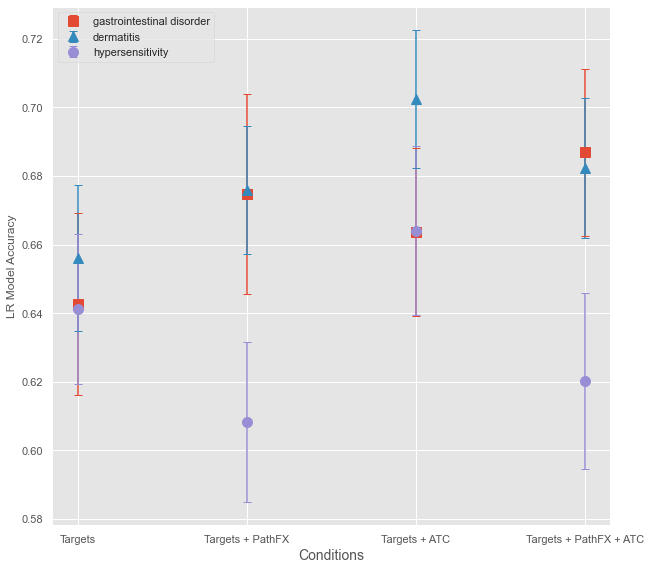

In [200]:
fig, ax = plt.subplots(figsize=(10, len(df.columns[:-1]) * 5))

# for col in df.columns[:-1]:
#     ax.errorbar(mean_df['Conditions'], mean_df[col], yerr=std_df[col], fmt='^', markersize=10, capsize=4, label=col)

for i, col in enumerate(df.columns[:-1]):
    if i == 0:
        marker_style = 's'  # Square marker for the first line
    if i == 1:
        marker_style = '^'
    if i == 2:
        marker_style = 'o'  # Circle marker for the rest of the lines

    ax.errorbar(mean_df['Conditions'], mean_df[col], yerr=std_df[col], fmt=marker_style, markersize=10, capsize=4, label=col)
ax.set_xlabel('Conditions', fontsize=14)
ax.set_ylabel('LR Model Accuracy')
ax.legend()

plt.subplots_adjust(bottom=0.4)
plt.show()

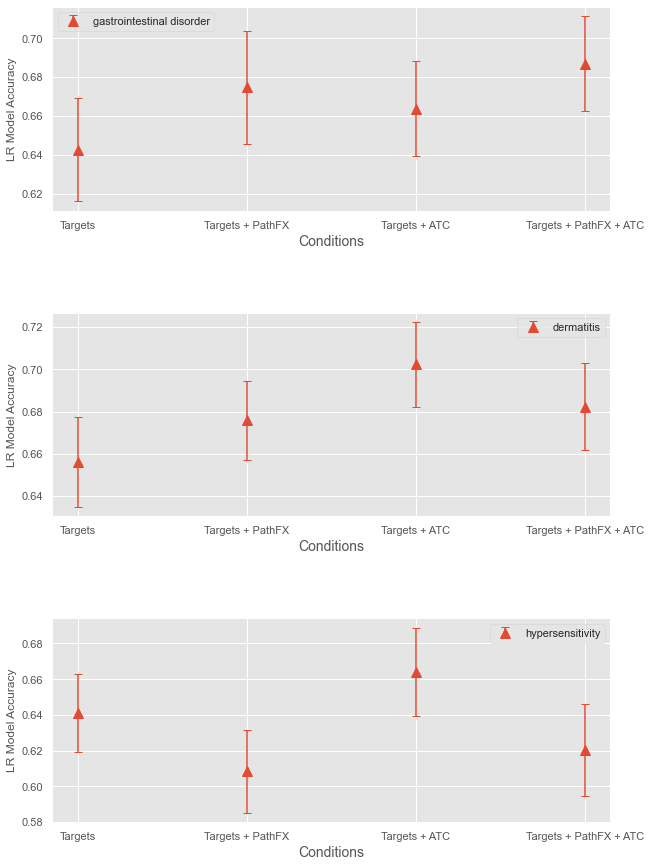

In [167]:
fig, axs = plt.subplots(len(df.columns[:-1]), 1, figsize=(10, len(df.columns[:-1]) * 5))
fig.subplots_adjust(hspace=0.5)

for i, col in enumerate(df.columns[:-1]):
    ax = axs[i]
    ax.errorbar(mean_df['Conditions'], mean_df[col], yerr=std_df[col], fmt='^', markersize=10, capsize=4, label=col)
    ax.set_xlabel('Conditions', fontsize=14)
    ax.set_ylabel('LR Model Accuracy')
    ax.legend()

plt.show()